

# **Lista 04 Processamento Digital de Imagens**
Professora: Mylene Farias

Monitores: André da Costa e Lucas Althoff


---


Nome: Igor Lima Rocha Azevedo

Matrícula: 16/0124981

Importar Bibliotecas

In [1]:
import cv2 
import numpy as np
from matplotlib import pyplot as plt

# Problema 1: Restauração

Baixe as imagens ruidosas 
- [exemplo 1](https://drive.google.com/file/d/1SFIqWaTvkVj1Qcwf5LjJ09tG0dn-2fBS/view?usp=sharing)
- [exemplo 2](https://drive.google.com/file/d/19nnMY5SfeLqzL_xZ1a2bllPzSO08MXk3/view?usp=sharing)
- [exemplo 3](https://drive.google.com/file/d/1oybZ-bOEDPU31JT48HKheSOww4gCCskC/view?usp=sharing)
- [exemplo 4](https://drive.google.com/file/d/14yMA7JW-MKyLYntO7gmjXuOfa9RiOnzR/view?usp=sharing)
- [exemplo 5](https://drive.google.com/file/d/1ZFdcdg-mA91oo7fnIw2Hz523XfJNGGDl/view?usp=sharing)

Em seguida, implemente 5 filtros estatísticos (à sua escolha) do Capítulo 05  para remoção de ruído. Utilize os filtros implementados para remover o ruído em cada uma das imagens. Comente os resultados obtidos. Quando possível, descreva o tipo de ruído presente na imagem. 

**Obs: Só é permitido utilizar a biblioteca OpenCV e Numpy**

In [2]:
def displayImage(image1, title1, title2='', image2='', 
                 title3='', image3='', title4='', image4='', figsize=(8, 12)):
    '''Função utilizada para fazer o display da imagem'''
    
    if image2 != '' and image3 != '' and image4 != '':      
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=figsize)
        ax1.imshow(image1, cmap = 'gray')
        ax1.axis('off')
        ax1.set_title(title1)
        
        ax2.imshow(image2, cmap = 'gray')
        ax2.axis('off')
        ax2.set_title(title2)
        
        ax3.imshow(image3, cmap = 'gray')
        ax3.axis('off')
        ax3.set_title(title3)
        
        ax4.imshow(image4, cmap = 'gray')
        ax4.axis('off')
        ax4.set_title(title4)
        
        fig.tight_layout()
    
    elif image2 != '' and image3 != '':      
        fig, ((ax1, ax2, ax3)) = plt.subplots(1, 3, figsize=figsize)
        ax1.imshow(image1, cmap = 'gray')
        ax1.axis('off')
        ax1.set_title(title1)
        
        ax2.imshow(image2, cmap = 'gray')
        ax2.axis('off')
        ax2.set_title(title2)
        
        ax3.imshow(image3, cmap = 'gray')
        ax3.axis('off')
        ax3.set_title(title3)
        
        fig.tight_layout()
        
    elif image2 != '':      
        fig, ((ax1, ax2)) = plt.subplots(1, 2, figsize=figsize)
        ax1.imshow(image1, cmap = 'gray')
        ax1.axis('off')
        ax1.set_title(title1)
        
        ax2.imshow(image2, cmap = 'gray')
        ax2.axis('off')
        ax2.set_title(title2)
        
        fig.tight_layout()
    else:
        plt.imshow(image1, cmap = 'gray')
        plt.title(title1)
        plt.axis('off')
        
    plt.show()

Array com exemplos

In [3]:
example_arr = ['./exemplo1.jpg', './exemplo-2.png', './exemplo-3.jpg', 
               './exemplo-4.jpg', './exemplo-5.jpg']

############## median ##############


/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


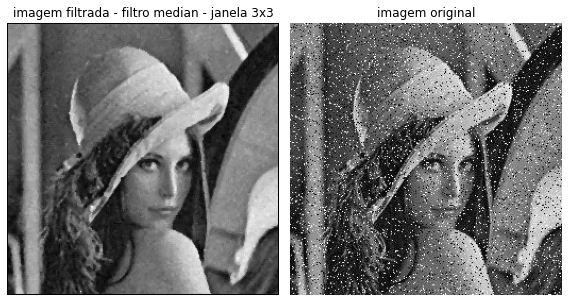

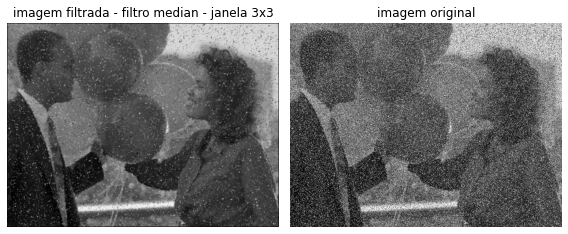

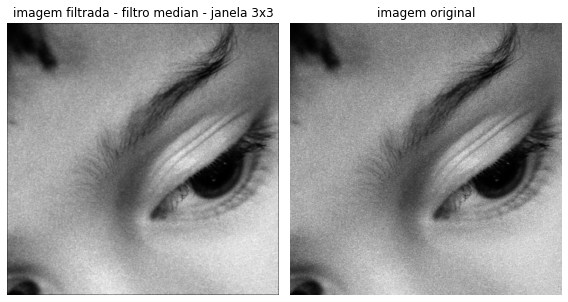

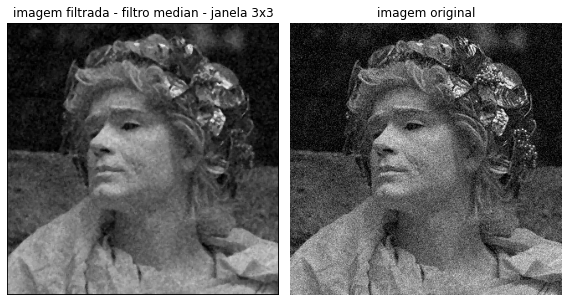

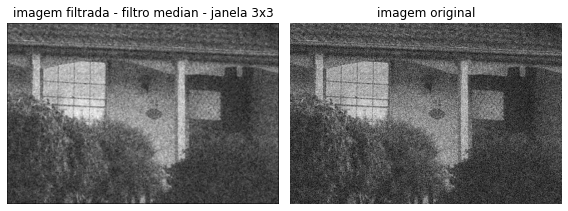





############## min ##############


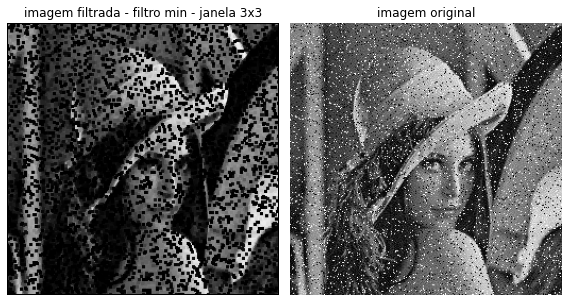

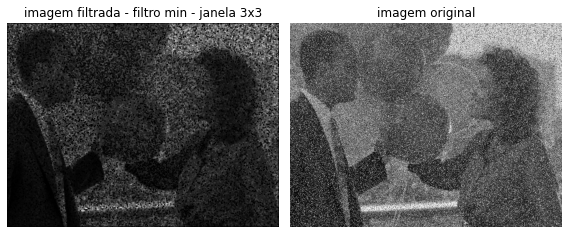

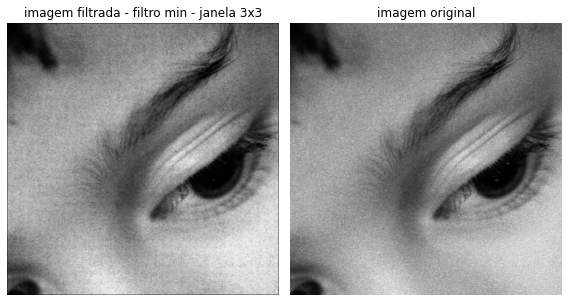

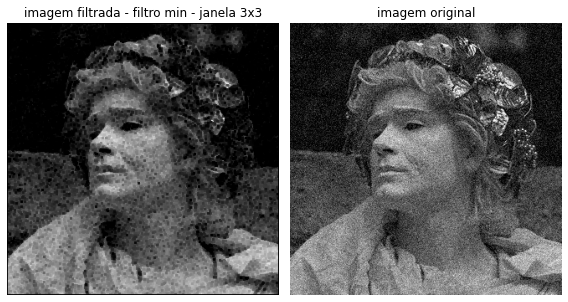

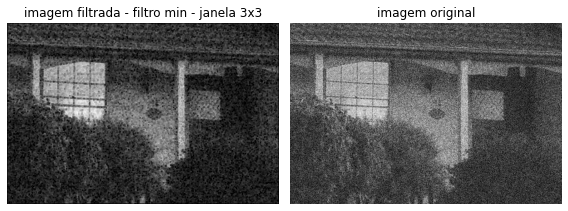





############## max ##############


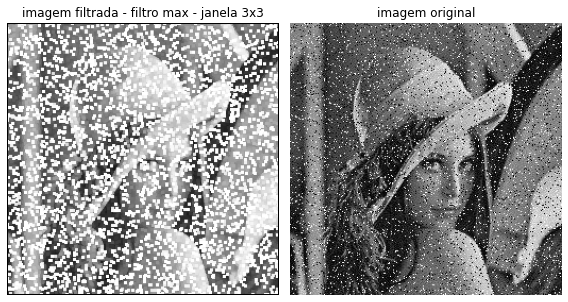

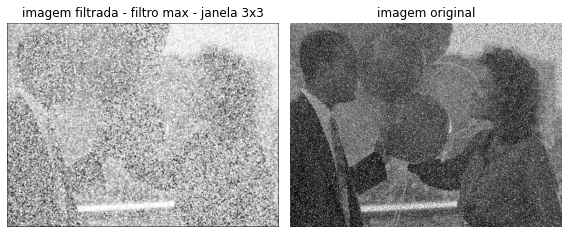

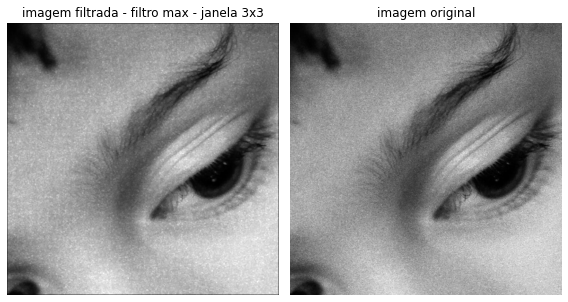

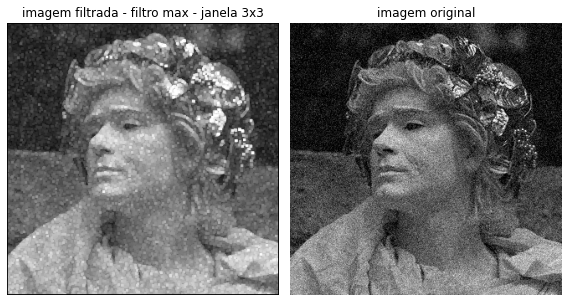

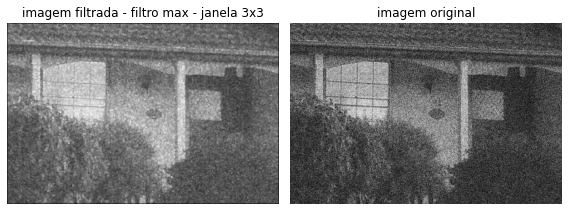





############## midpoint ##############


/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: overflow encountered in ubyte_scalars


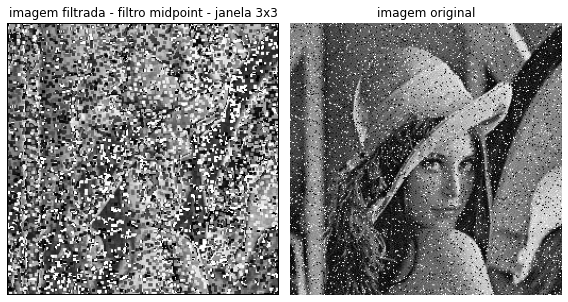

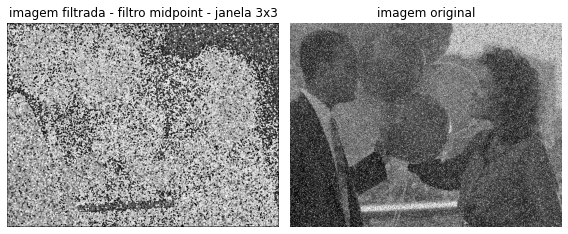

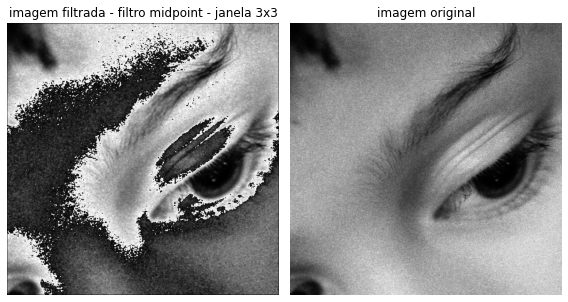

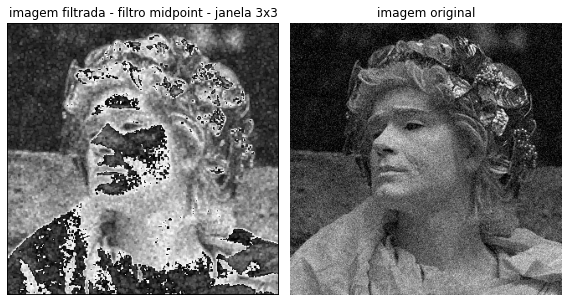

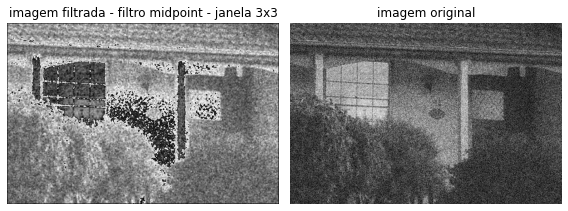





############## alpha ##############


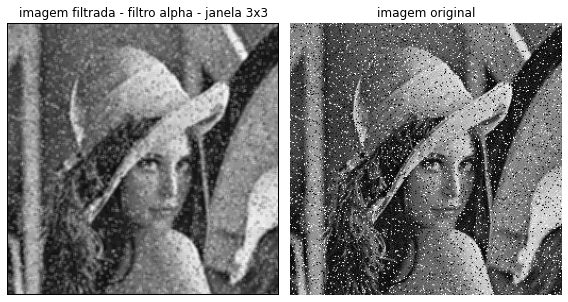

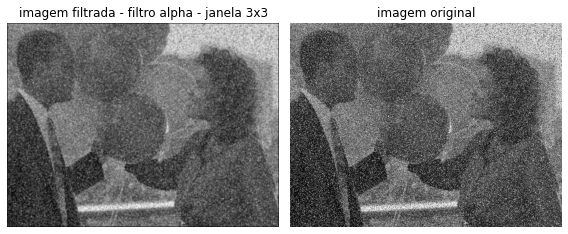

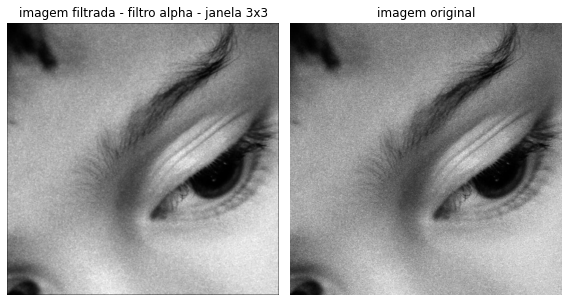

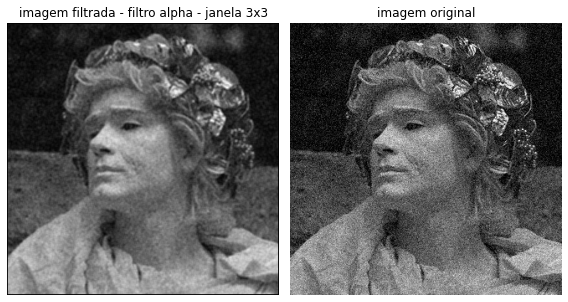

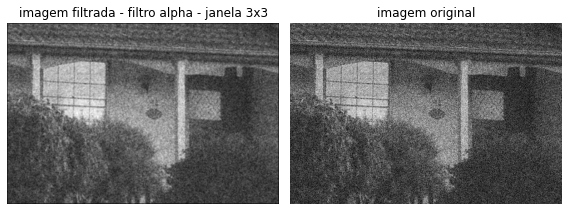

In [4]:
def statisticFilter(img_path, measurement, M, N, d=0):
    img = cv2.imread(img_path, 0)
    height, width = img.shape
    img_out = np.zeros(shape=(height, width), dtype='uint8')
        
    
    img_arr = []
    k_i = M - int(M/2+1)
    k_j = N - int(N/2+1)
    for i in range(k_i, height-k_i): 
        for j in range(k_j, width-k_j): 
            img_arr = img[i-k_i:i+M-k_i, j-k_j:j+N-k_j].flat[0:M*N]
            img_arr = sorted(img_arr) 
            if measurement == 'median':
                img_out[i, j] = img_arr[int(len(img_arr)/2)] 
            elif measurement == 'min':
                img_out[i, j] = img_arr[0] 
            elif measurement == 'max':
                img_out[i, j] = img_arr[len(img_arr)-1] 
            elif measurement == 'midpoint':
                temp = (img_arr[len(img_arr)-1] + img_arr[0])/2
                if temp > 255: img_out[i, j] = 255
                elif temp < 0: img_out[i, j] = 0
                else: img_out[i,j] = temp
            elif measurement == 'alpha':
                temp = (1/(M*N - d))*sum(img_arr)
                if temp > 255: img_out[i, j] = 255
                elif temp < 0: img_out[i, j] = 0
                else: img_out[i,j] = temp
            
    return img_out

measurement_arr = ['median', 'min', 'max', 'midpoint', 'alpha']
window_height = 3
window_width = 3
figsize=(10, 8)
for measure in measurement_arr:
    print('############## {} ##############'.format(measure))
    if measure == 'alpha':
        d = 1
    for img_path in example_arr:
        img = cv2.imread(img_path, 0)
        img_median = statisticFilter(img_path, measure, window_height, window_width)
        title1 = 'imagem filtrada - filtro {} - janela {}x{}'\
                    .format(measure, window_height, window_width)
        title2 = 'imagem original'
        displayImage(img_median, title1, title2, img, figsize)
    print('\n\n\n')

É possível então comentar sobre os ruídos presentes em cada imagem:
- Exemplo 1 - Sal e pimenta
- Exemplo 2 - Uniforme
- Exemplo 3 - Não soube dizer
- Exemplo 4 - Não soube dizer
- Exemplo 5 - Não soube dizer

Pode-se plotar os histogramas das imagens para obter mais insights sobre os ruídos presentes nas imagens

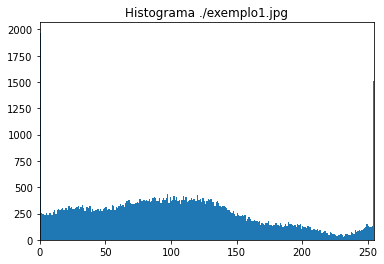

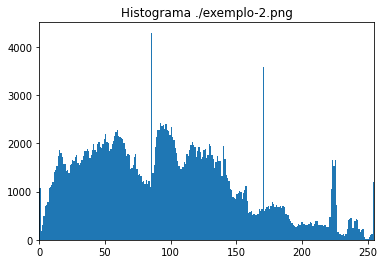

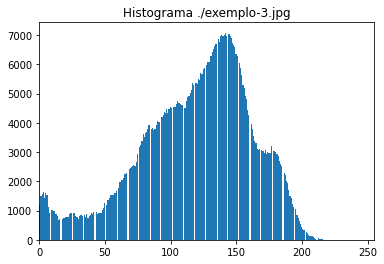

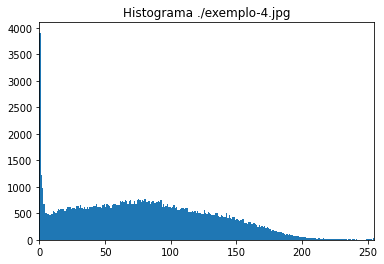

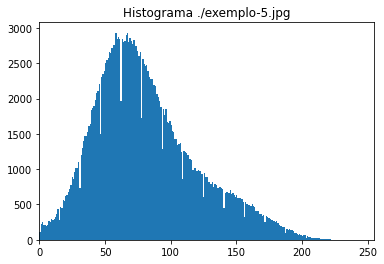

In [5]:

for image_path in example_arr:
    im = cv2.imread(image_path)
    # calculate mean value from RGB channels and flatten to 1D array
    vals = im.mean(axis=2).flatten()
    # plot histogram with 255 bins
    b, bins, patches = plt.hist(vals, 255)
    plt.title('Histograma ' + image_path)
    plt.xlim([0,255])
    plt.show()

# Problema 2: Halftoning and Dithering

**1.1**
Implemente um algoritmo "halftoning" baseado em padrões de pontos. A figura abaixo mostra os padrões que podem ser utilizados para aproximar dez níveis de tons de cinza. Cada nível é representado por um padrão 3x3 de pontos brancos e pretos. Uma área de 3x3 pixels cheia de pontos pretos é uma aproximação de um nível de cinza preto ou '0'. Da mesma forma, uma área de 3x3 pixels de pontos brancos é uma aproximação do nível de cinza branco ou '9'. Os outros padrões são aproximações dos níveis de cinza intermediários (entre os dois extremos '0' e '9'). 

Teste o seu programa com duas imagens de sua preferência. Observe que cada pixel na imagem de entrada irá corresponder a um padão de 3x3 pixels na imagem impressa.  Desta forma, a resolução espacial será reduzida a 33% da resolução espacial da imagem original. Imprima o resultado da sua implementação. 

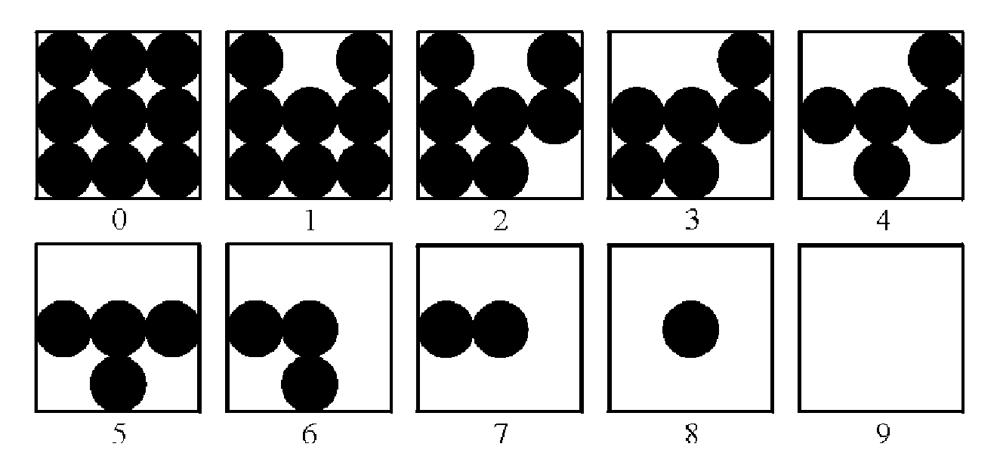

In [6]:
def halftoningAlgorithm(img_path, img=''):    
    ## Cpiar a matriz apresentada acima em forma de array
    matrix_halftoning = [[[0, 0, 0],[0, 0, 0],[0, 0, 0]],
                          [[0, 1, 0],[0, 0, 0],[0, 0, 0]],
                          [[0, 1, 0],[0, 0, 0],[0, 0, 1]],
                          [[1, 1, 0],[0, 0, 0],[0, 0, 1]],
                          [[1, 1, 0],[0, 0, 0],[1, 0, 1]],
                          [[1, 1, 1],[0, 0, 0],[1, 0, 1]],
                          [[1, 1, 1],[0, 0, 1],[1, 0, 1]],
                          [[1, 1, 1],[0, 0, 1],[1, 1, 1]],
                          [[1, 1, 1],[1, 0, 1],[1, 1, 1]],
                          [[1, 1, 1],[1, 1, 1],[1, 1, 1]]]
    
    if img == '':
        img = cv2.imread(img_path, 0)
    height, width = img.shape
    ## Aumentar a resolução 
    img_out = np.zeros(shape=(3*height, 3*width), dtype=np.uint8)
    
    ## Varrer a imagem e processar os pixels de acordo com a matriz de halftoning
    for i in range(height):
        for j in range(width):
            temp = int((9*img[i, j])/255)
            for x in range(3):
                for y in range(3):
                    img_out[x+i*3, y+j*3] = 255*matrix_halftoning[temp][x][y]
    
    return img_out

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


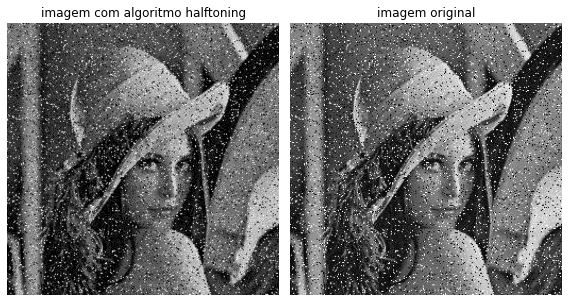

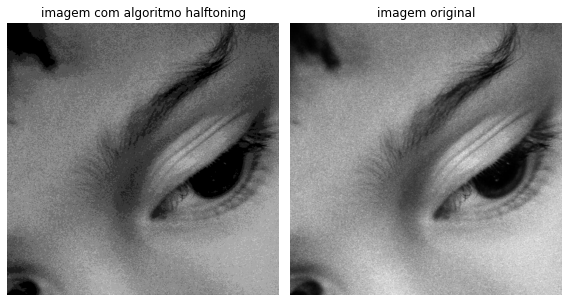

In [7]:
figsize = (10, 8)
for img_path in ['./exemplo1.jpg', 'exemplo-3.jpg']:
    img = cv2.imread(img_path, 0)
    img_out = halftoningAlgorithm(img_path)
    title1 = 'imagem com algoritmo halftoning'
    title2 = 'imagem original'
    displayImage(img_out, title1, title2, img, figsize)

**2.2**  Como pode ser observado na questão anterior, o halftoning descrito em 2.1 não é capaz de representar areas da imagem com transições suaves de intensidade, gerando artefatos de falsos contornos. Uma maneira de corrigir este problema é adicionar ruído (branco) a imagem antes da codificação. Repita o exemplo anterior adicionando ruído às duas imagens antes da sua conversão. Imprima os resultados e comente as diferenças. 

In [8]:
def noisy(noise_typ,image):
    '''Referência: 
    https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv'''
    row,col = image.shape
    
    if noise_typ == "gauss":
        mean = 0
        var = 10
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col))
        gauss = gauss.reshape(row,col)
        noisy = image + gauss
        
        return noisy
    
    elif noise_typ == "s&p":
        s_vs_p = 0.5
        amount = 0.004
        out = np.copy(image)
        # Salt mode
        num_salt = np.ceil(amount * image.size * s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt))
                  for i in image.shape]
        out[coords] = 1

        # Pepper mode
        num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper))
                  for i in image.shape]
        out[coords] = 0
        
        return out
    elif noise_typ == "poisson":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        
        return noisy

Será adicionado o ruído do tipo Gauss e assim será aplicado o algoritmo halftoning nessas imagems.

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """


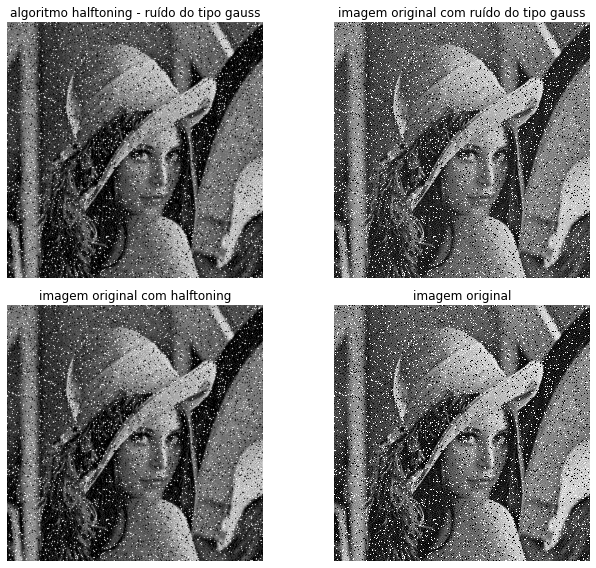

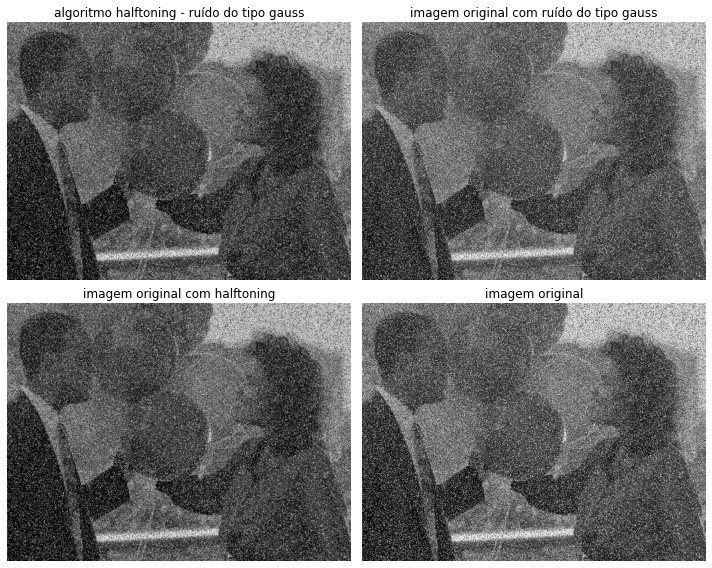

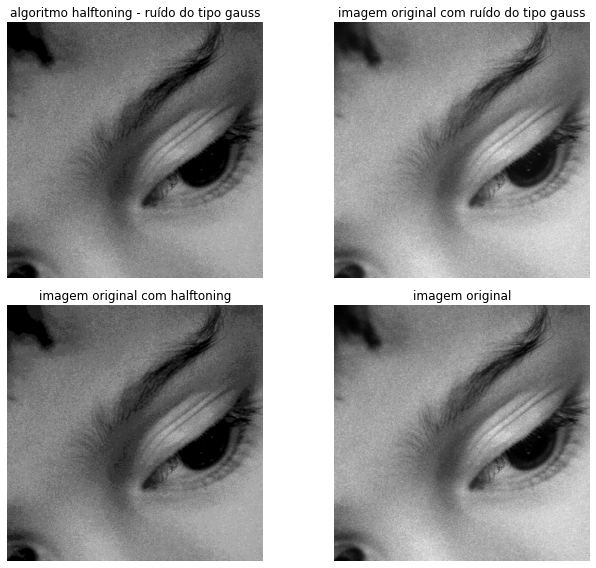

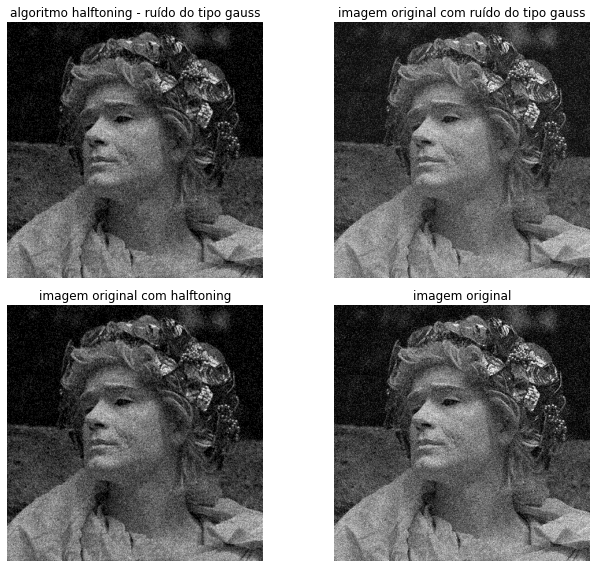

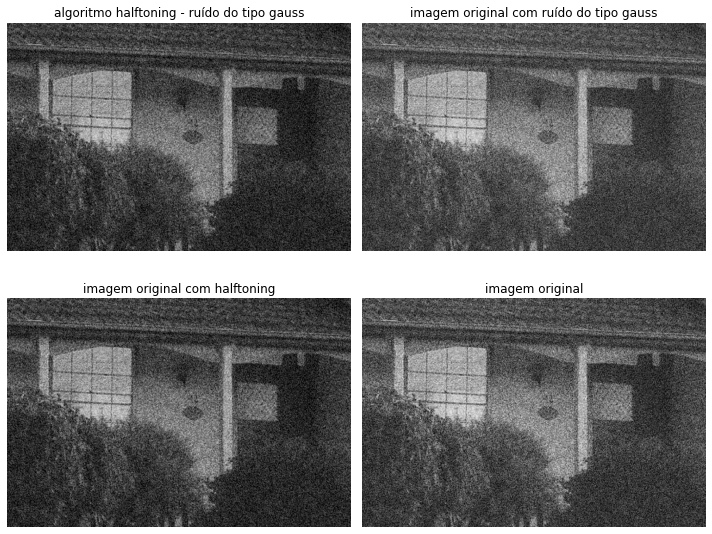

In [9]:
figsize = (10, 8)
noise_arr = ['gauss']
for noise in noise_arr:
    for img_path in example_arr:
        img = cv2.imread(img_path, 0)
        img_half = halftoningAlgorithm(img_path)
        noise_img = noisy(noise, img)
        img_out = halftoningAlgorithm('', noise_img)
        title1 = 'algoritmo halftoning - ruído do tipo {}'.format(noise)
        title2 = 'imagem original com ruído do tipo {}'.format(noise)
        title3 = 'imagem original com halftoning'
        title4 = 'imagem original'
        displayImage(img_out, title1, title2, noise_img, 
                     title3, img_half, title4, img, figsize)
        print('\n\n\n')

**2.3**  Uma técnica de representação que obtém melhores resultados que o halftoning é o *dithering*.  No dithering, cada elemento de um bloco da imagem é quantizado (codificado) utilizando o padrão de dither como limiar (*threshold*). 

A técnica consiste em encontrar o valor truncado mais próximo (ou a cor disponível mais próxima). Em seguida, calcula-se a diferença entre o valor original e este valor truncado. Este erro é distribuído entre os pixels (futuros) vizinhos. 

Mais especificamente, podemos expressar a distribuição do erro entre os vizinhos de uma imagem com padrões (ou filtros). Os valores do padrão de *dither* são fixos, mas tipicamente diferentes entre si. 

O padrão abaixo é o padrão de dithering de **Floyd-Steinberg**:
 ```
       x  7
    3  5  1
 ```
Neste padrão, o x representa o pixel que está sendo processado e os números (pesos) representam a proporção da distribuição em cada uma das posições. Nesta expressão, o pixel imediatamente à direita de x recebe 7/16 (o valor 16 vem do fato da soma dos pesos ter este valor), o pixel imediatamente abaixo do x recebe 5/16 do erro e os pixels adjacentes diagonalmente recebem 3/16 e 1/16. 

Para obter a imagem binária com ditheiring, processamos a imagem da esquerda-para-direita e de cima-para-baixo. Vamos considerar uma imagem com valores normalizados entre 0 e 1. Para cada pixel da imagem I(x,y), primeiramente arredondamos o pixel para o valor 'branco' (1 ou 255) ou 'preto' (0) que seja mais próximo:

```
if (I[x][y] < 0.5) 
     P[x][y]=0.0;
else 
    P[x][y]=1.0;
```


Após o arredondamento, calculamos o erro para o valor original:

``` erro= P[x][y] - I[x][y] ```

 Em seguida o erro é distribuído entre os pixels vizinhos:
 ```
I[x][y+1] = I[x][y+1] + erro* 7/16;
I[x+1][y-1] = I[x+1][y-1] + erro* 3/16;
I[x+1][y] = I[x+1][y] + erro* 5/16;
I[x+1][y+1] = I[x+1][y+1] + erro* 1/16;
 ```
O mesmo procedimento pode ser utilizado para implementação do algoritmo de dithering de **Stucki** que tem o seguinte padrão:

 ```
      x 8 4
  2 4 8 4 2
  1 2 4 2 1
 ```
Implemente o algoritmo de dithering Floyd-Steinberg e o de  Stucki  descritos acima. Teste o seu programa com duas imagens de sua preferência e compare os resultados com os obtidos em 2.2 e 2.1. 


<strong>OBS: </strong>Para uma melhor visualização dos resultados além de estarem sendo disponibilizados no próprio notebook eles estão sendo salvos também em um folder com o formado .bmp

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


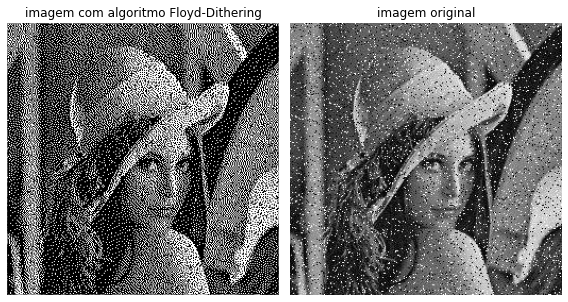

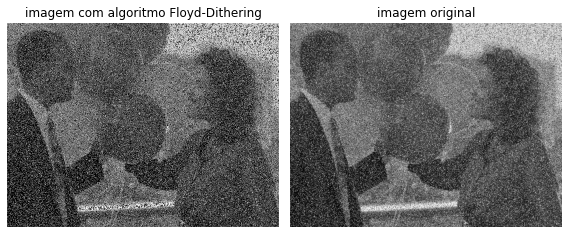

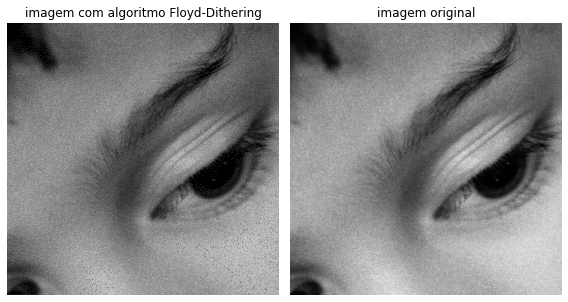

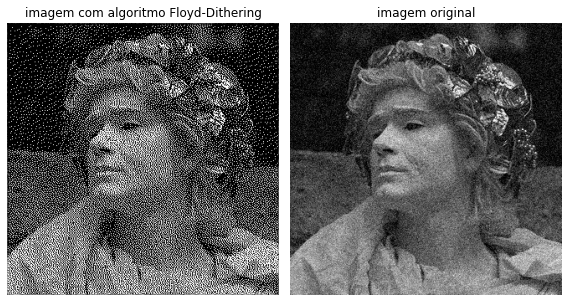

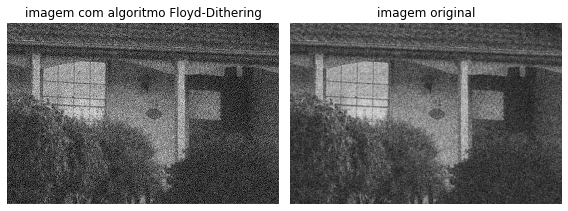

In [10]:
def minmax(el):
    if el > 255: v = 255
    if el < 0: el = 0
    return el

def ditheringFloydStein(img_path, threshold):
    
    coef = [7.0, 3.0, 5.0, 1.0]
    
    img = cv2.imread(img_path)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    img_out = np.zeros(shape=(height, width), dtype=np.uint8)
    img_out = img
    
    for i in range(1, height-1):
        for j in range(1, width-1):
            old_pixel = img[i, j]
            new_pixel = np.round(threshold * old_pixel/255.0) * (255/threshold)
            img[i, j] = new_pixel
            quant_error_p = old_pixel - new_pixel
            
            img_out[i, j+1] = minmax(img[i, j+1] + quant_error_p * (coef[0]/sum(coef)))
            img_out[i+1, j-1] = minmax(img[i+1, j-1] + quant_error_p * (coef[1]/sum(coef)))
            img_out[i+1, j] = minmax(img[i+1, j] + quant_error_p * (coef[2]/sum(coef)))
            img_out[i+1, j+1] = minmax(img[i+1, j+1] + quant_error_p * (coef[3]/sum(coef)))
            
    return img_out.astype(np.uint8)

            

for img_path in example_arr:
    figsize = (10, 8)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img_floyd = ditheringFloydStein(img_path, 1)
    cv2.imwrite('./DitheringResults/image_floyd_steinberg_{}.bmp'.format(img_path.split('/')[1])
                ,img_floyd) 
    title1 = 'imagem com algoritmo Floyd-Dithering'
    title2 = 'imagem original'
    displayImage(img_floyd, title1, title2, img, figsize)   

/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
/Users/igorlimarochaazevedo/Documents/UnB/Processamento Dig. Img./Lista4/venv_lista4/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison


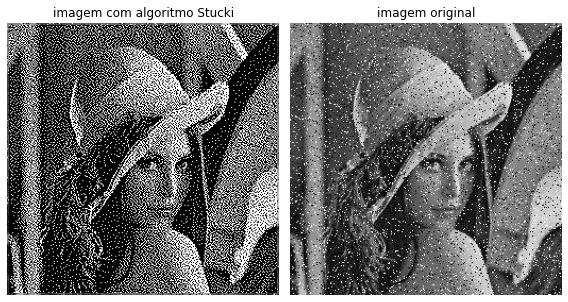

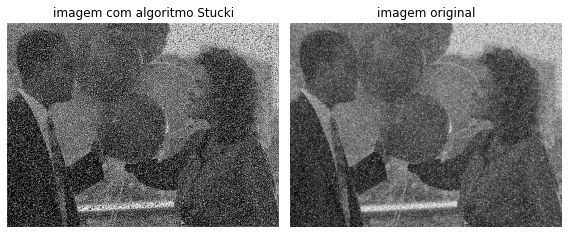

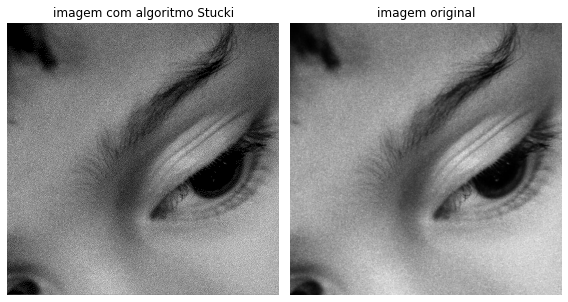

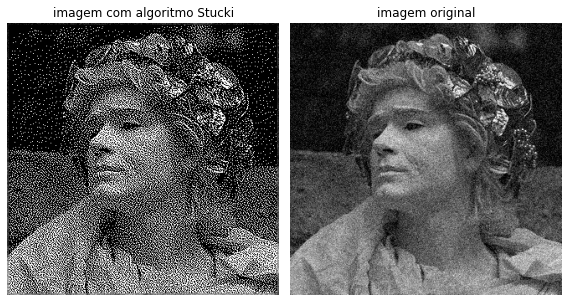

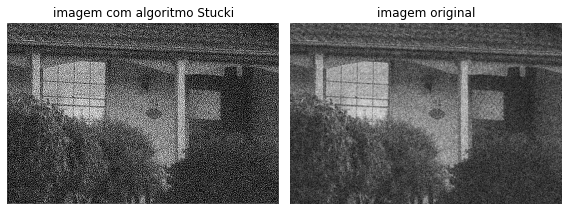

In [11]:
def minmax(el):
    if el > 255: v = 255
    if el < 0: el = 0
    return el

def ditheringStucki(img_path, threshold):
    
    coef = [8.0, 4.0, 2.0, 1.0]
    total = 42.0
    
    img = cv2.imread(img_path)
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    except:
        pass
    height, width = img.shape
    
    img_out = np.zeros(shape=(height, width), dtype=np.uint8)
    img_out = img
    
    for i in range(2, height-2):
        for j in range(2, width-2):
            old_pixel = img[i, j]
            new_pixel = np.round(threshold * old_pixel/255.0) * (255/threshold)
            img[i, j] = new_pixel
            quant_error_p = old_pixel - new_pixel
            
            img_out[i, j+1] = minmax(img[i, j+1] + quant_error_p * (coef[0]/total))
            img_out[i, j+2] = minmax(img[i, j+2] + quant_error_p * (coef[1]/total))
            
            img_out[i+1, j-2] = minmax(img[i+1, j-2] + quant_error_p * (coef[2]/total))
            img_out[i+1, j-1] = minmax(img[i+1, j-1] + quant_error_p * (coef[1]/total))
            img_out[i+1, j] = minmax(img[i+1, j] + quant_error_p * (coef[0]/total))
            img_out[i+1, j+1] = minmax(img[i+1, j+1] + quant_error_p * (coef[1]/total))
            img_out[i+1, j+2] = minmax(img[i+1, j+2] + quant_error_p * (coef[2]/total))
            
            img_out[i+2, j-2] = minmax(img[i+2, j-2] + quant_error_p * (coef[3]/total))
            img_out[i+2, j-1] = minmax(img[i+2, j-1] + quant_error_p * (coef[2]/total))
            img_out[i+2, j] = minmax(img[i+2, j] + quant_error_p * (coef[1]/total))
            img_out[i+2, j+1] = minmax(img[i+2, j+1] + quant_error_p * (coef[2]/total))
            img_out[i+2, j+2] = minmax(img[i+2, j+2] + quant_error_p * (coef[3]/total))
            
    return img_out.astype(np.uint8)

            

for img_path in example_arr:
    figsize = (10, 8)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img_stucki = ditheringStucki(img_path, 1)
    cv2.imwrite('./DitheringResults/image_stucki_{}.bmp'.format(img_path.split('/')[1])
                ,img_stucki) 
    title1 = 'imagem com algoritmo Stucki'
    title2 = 'imagem original'
    displayImage(img_stucki, title1, title2, img, figsize)   